In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import scipy

In [13]:
train_data = pd.read_csv('train_dataset_clean.csv')

In [14]:
train_data.describe()

,WELLNUM,DEPTH,DTC,DTS,DEN,GR,NEU,PEF,RDEP,RMED,PHIF,SW,VSH
count,42309.000000,42309.000000,19314.000000,7198.000000,42309.000000,42309.000000,42306.000000,40429.000000,42075.000000,42309.000000,42309.000000,42309.000000,42309.000000
mean,4.985866,12245.593757,76.710857,131.021627,2.411064,39.888234,0.181612,5.185693,0.602216,0.710817,0.141736,0.667124,0.275485
std,2.268441,1604.293688,12.312749,14.551402,0.160632,24.822777,0.066775,1.715554,0.645071,0.843949,0.081144,0.354821,0.206619
min,0.000000,8494.000000,1.025100,74.822400,1.626600,4.588597,-0.003400,-0.013100,-0.887730,-0.855737,0.000000,0.013000,-0.248000
25%,4.000000,11191.600000,68.909410,123.151225,2.264400,20.069900,0.144110,4.583000,0.168936,0.185060,0.068437,0.297700,0.113500
50%,6.000000,11910.110000,74.998850,131.898800,2.419800,35.799400,0.176400,5.414100,0.444872,0.522079,0.141000,0.808000,0.232600
75%,6.000000,13375.330000,83.715325,138.538250,2.544000,52.007100,0.215500,6.096800,0.960457,1.050073,0.217000,1.000000,0.360400
max,8.000000,15566.930000,123.253500,193.840200,3.089600,304.333700,0.862567,13.356600,4.904536,4.794424,0.403294,1.000000,2.460104


In [22]:
#Convert logarithm values of resistivity logs back to normal value
train_data["RDEP"]=10**(train_data["RDEP"])
train_data["RMED"]=10**(train_data["RMED"])
train_data.describe()

,WELLNUM,DEPTH,DTC,DTS,DEN,GR,NEU,PEF,RDEP,RMED,PHIF,SW,VSH
count,42309.000000,42309.000000,19314.000000,7198.000000,42309.000000,42309.000000,42306.000000,40429.000000,42075.000000,42309.000000,42309.000000,42309.000000,42309.000000
mean,4.985866,12245.593757,76.710857,131.021627,2.411064,39.888234,0.181612,5.185693,25.199747,1029.768280,0.141736,0.667124,0.275485
std,2.268441,1604.293688,12.312749,14.551402,0.160632,24.822777,0.066775,1.715554,440.389867,7800.685663,0.081144,0.354821,0.206619
min,0.000000,8494.000000,1.025100,74.822400,1.626600,4.588597,-0.003400,-0.013100,0.129500,0.139400,0.000000,0.013000,-0.248000
25%,4.000000,11191.600000,68.909410,123.151225,2.264400,20.069900,0.144110,4.583000,1.475490,1.531300,0.068437,0.297700,0.113500
50%,6.000000,11910.110000,74.998850,131.898800,2.419800,35.799400,0.176400,5.414100,2.785300,3.327200,0.141000,0.808000,0.232600
75%,6.000000,13375.330000,83.715325,138.538250,2.544000,52.007100,0.215500,6.096800,9.129700,11.222060,0.217000,1.000000,0.360400
max,8.000000,15566.930000,123.253500,193.840200,3.089600,304.333700,0.862567,13.356600,80266.800000,62290.800000,0.403294,1.000000,2.460104


In [23]:
train_data['WELLNUM'].unique()

array([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype=int64)

In [24]:
grouped = train_data.groupby('WELLNUM')

In [25]:
grouped.head()

,WELLNUM,DEPTH,DTC,DTS,DEN,GR,NEU,PEF,RDEP,RMED,PHIF,SW,VSH
0,0,14121.660105,89.6461,NaN,2.577700,88.8573,0.277790,NaN,2.631000,2.492700,0.000000,1.0000,0.751631
1,0,14122.160105,96.0152,NaN,2.474800,120.8949,0.294806,NaN,2.476000,2.468500,0.000000,1.0000,1.032475
2,0,14122.660105,104.0457,NaN,2.333800,153.5195,0.447361,NaN,2.435900,2.374200,0.000000,1.0000,1.312757
3,0,14123.160105,113.5010,NaN,2.235800,182.8531,0.579637,NaN,2.406500,2.414200,0.000000,1.0000,1.682292
4,0,14123.660105,117.7817,NaN,2.227800,256.1960,0.556317,NaN,2.336500,2.407700,0.000000,1.0000,1.924398
1880,1,10891.400000,68.4532,NaN,2.632000,129.3430,0.109800,7.39060,1.465300,1.307900,0.020000,1.0000,0.744600
1881,1,10891.730000,68.2104,NaN,2.642600,94.6083,0.105400,7.09660,1.504100,1.482400,0.020000,1.0000,0.758200
1882,1,10892.060000,67.8065,NaN,2.637700,72.5098,0.105100,6.78060,1.739600,1.959300,0.020000,1.0000,0.547700
1883,1,10892.390000,67.1673,NaN,2.618100,58.2253,0.104700,6.49060,1.932900,2.470200,0.023800,1.0000,0.411700
1884,1,10892.720000,66.6096,NaN,2.587300,52.7181,0.106100,6.27850,1.965000,2.564100,0.041300,1.0000,0.359200


In [26]:
# Create empty lists
train_datas_wells = []
wellnames = []

#Split up the data by well
for well, data in grouped:
    train_datas_wells.append(data)
    wellnames.append(well)

In [27]:
for i, well in enumerate(wellnames):
    print(f'Index: {i} - {well}')

Index: 0 - 0
Index: 1 - 1
Index: 2 - 2
Index: 3 - 3
Index: 4 - 4
Index: 5 - 5
Index: 6 - 6
Index: 7 - 7
Index: 8 - 8


In [28]:
def create_plot(wellname, dataframe, curves_to_plot, depth_curve, log_curves=[]):
    # Count the number of tracks we need
    num_tracks = len(curves_to_plot)
    
    # Setup the figure and axes
    fig, ax = plt.subplots(nrows=1, ncols=num_tracks, figsize=(num_tracks*2, 10))
    
    # Create a super title for the entire plot
    fig.suptitle(wellname, fontsize=20, y=1.05)
    
    # Loop through each curve in curves_to_plot and create a track with that data
    for i, curve in enumerate(curves_to_plot):
        
        
        ax[i].plot(dataframe[curve], depth_curve)
        
        # Setup a few plot cosmetics
        ax[i].set_title(curve, fontsize=14, fontweight='bold')
        ax[i].grid(which='major', color='lightgrey', linestyle='-')
        
        # We want to pass in the deepest depth first, so we are displaying the data 
        # from shallow to deep
        ax[i].set_ylim(depth_curve.max(), depth_curve.min())

        # Only set the y-label for the first track. Hide it for the rest
        if i == 0:
            ax[i].set_ylabel('DEPTH (m)', fontsize=18, fontweight='bold')
        else:
            plt.setp(ax[i].get_yticklabels(), visible = False)
        
        # Check to see if we have any logarithmic scaled curves
        if curve in log_curves:
            ax[i].set_xscale('log')
            ax[i].grid(which='minor', color='lightgrey', linestyle='-')
    
    plt.tight_layout()
    plt.show()

In [29]:
curves_to_plot = ['DTC', 'DTS', 'GR', 'NEU', 'RDEP', 'RMED', 'DEN', 'PEF', 'PHIF', 'SW', 'VSH']
logarithmic_curves = ['RDEP', 'RMED']

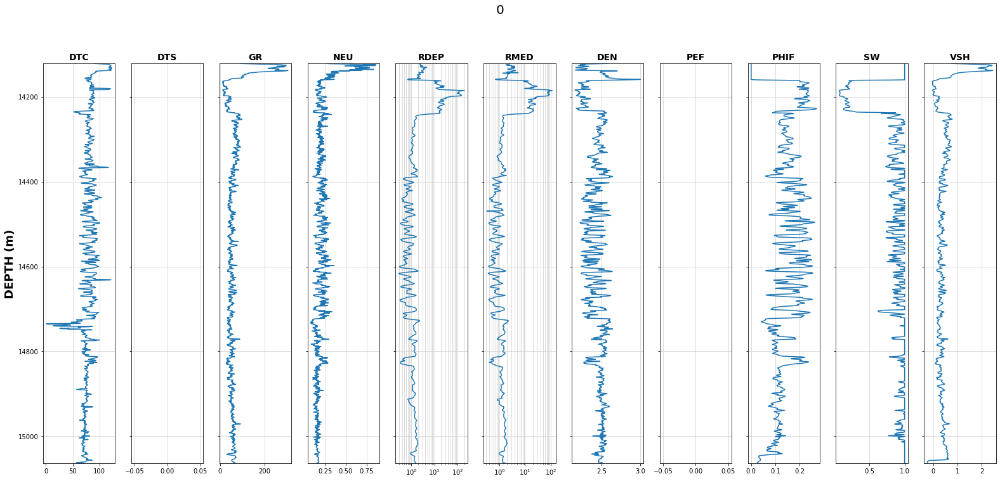

In [31]:
well = 0
create_plot(wellnames[well], train_datas_wells[well], curves_to_plot, train_datas_wells[well]['DEPTH'], logarithmic_curves)

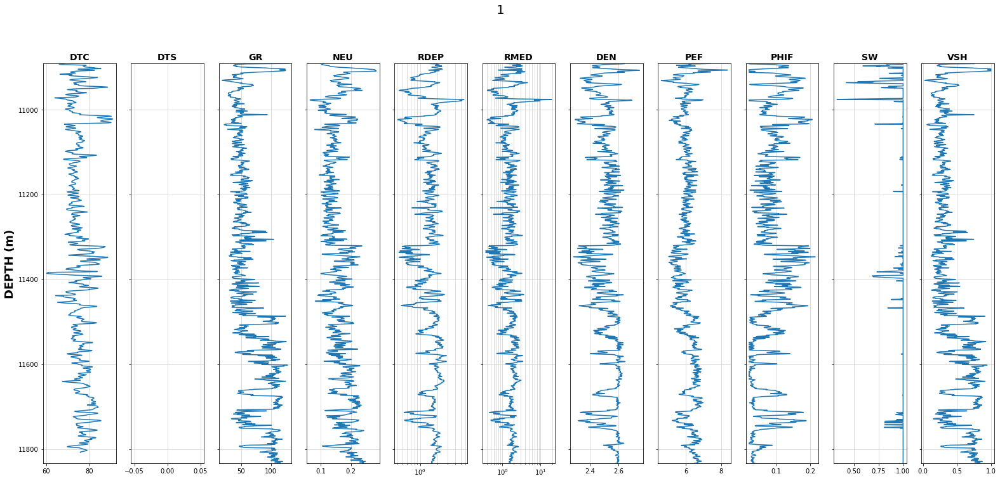

In [32]:
well = 1
create_plot(wellnames[well], train_datas_wells[well], curves_to_plot, train_datas_wells[well]['DEPTH'], logarithmic_curves)

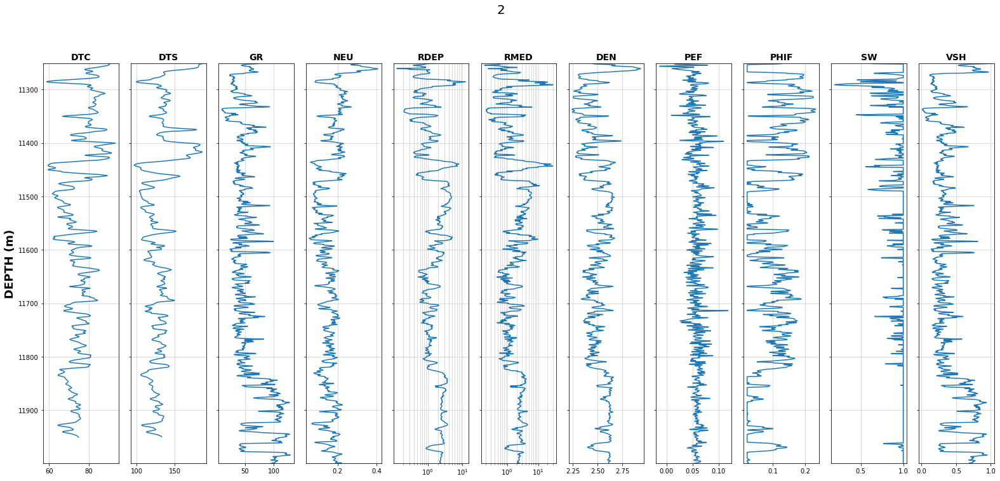

In [33]:
well = 2
create_plot(wellnames[well], train_datas_wells[well], curves_to_plot, train_datas_wells[well]['DEPTH'], logarithmic_curves)

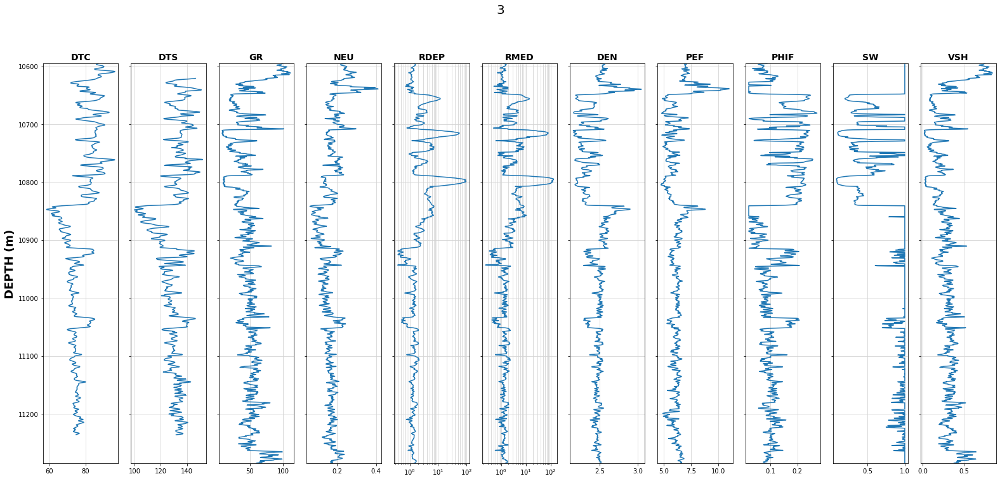

In [34]:
well = 3
create_plot(wellnames[well], train_datas_wells[well], curves_to_plot, train_datas_wells[well]['DEPTH'], logarithmic_curves)

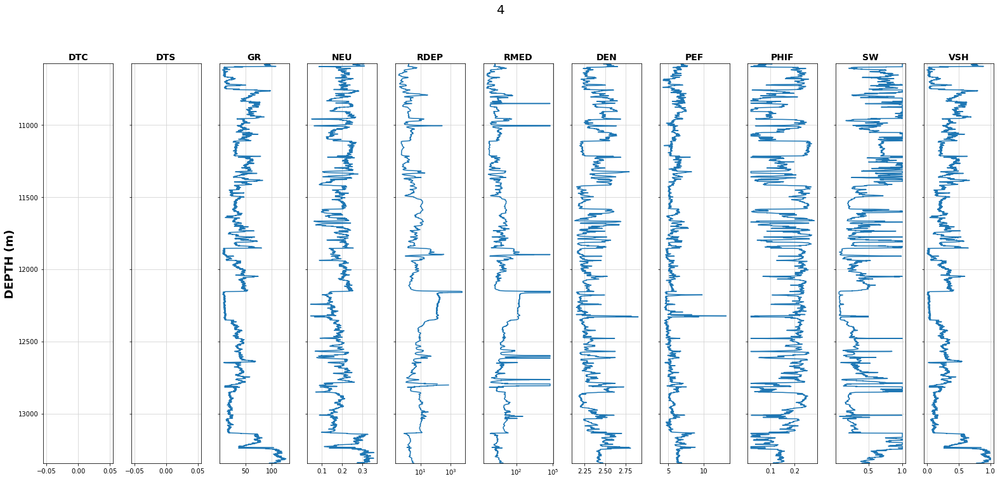

In [35]:
well = 4
create_plot(wellnames[well], train_datas_wells[well], curves_to_plot, train_datas_wells[well]['DEPTH'], logarithmic_curves)

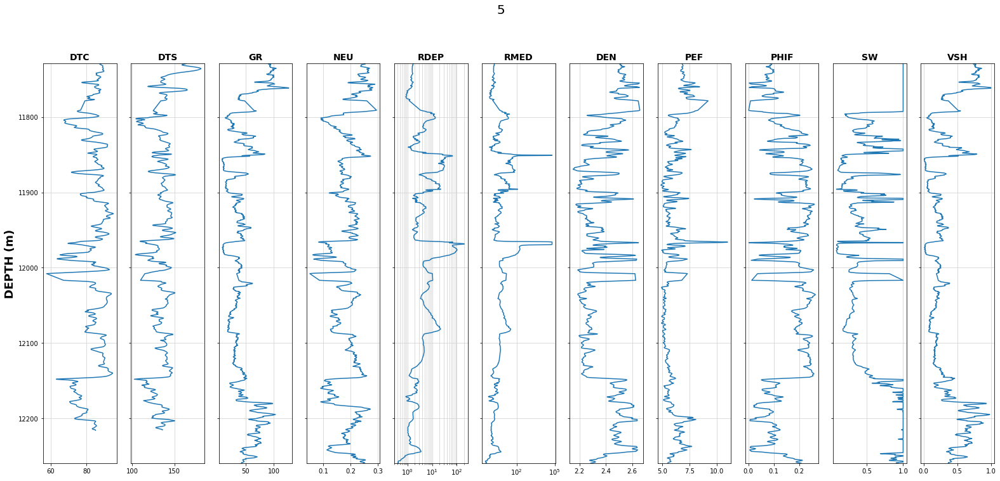

In [36]:
well = 5
create_plot(wellnames[well], train_datas_wells[well], curves_to_plot, train_datas_wells[well]['DEPTH'], logarithmic_curves)

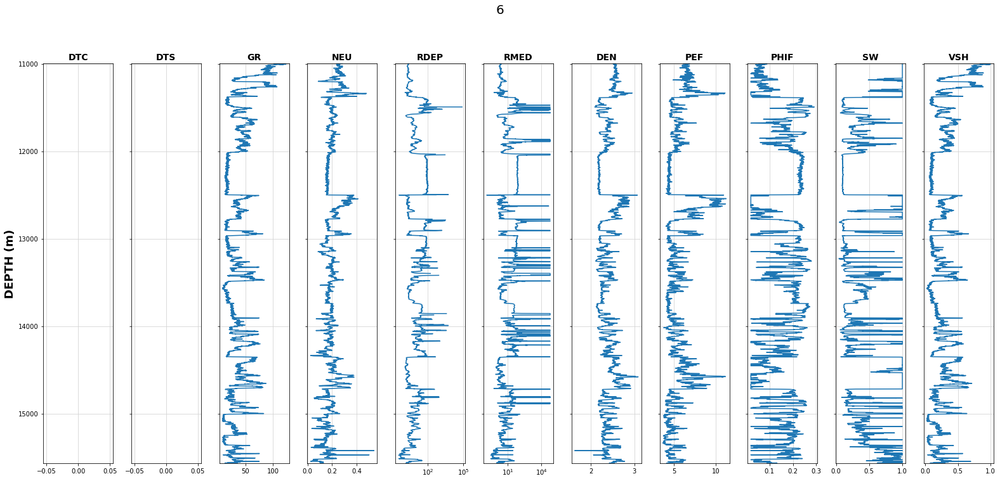

In [37]:
well = 6
create_plot(wellnames[well], train_datas_wells[well], curves_to_plot, train_datas_wells[well]['DEPTH'], logarithmic_curves)

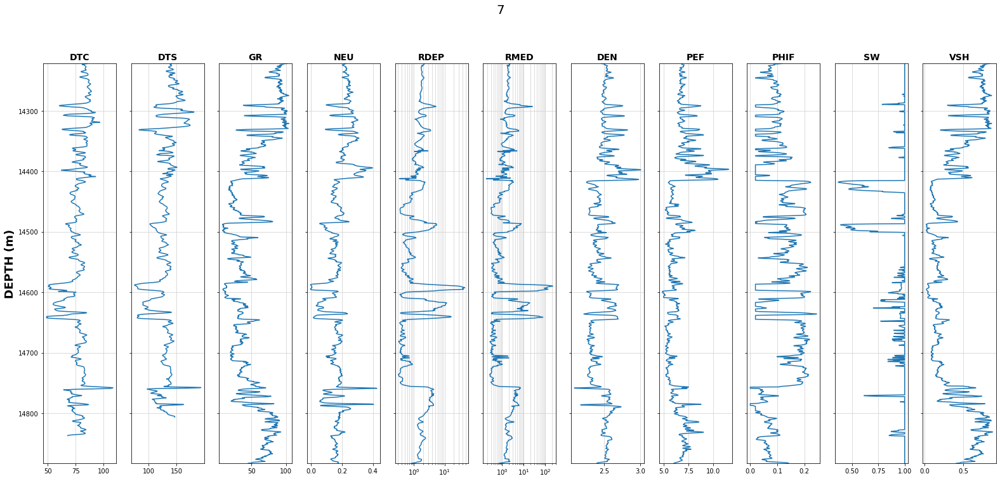

In [38]:
well = 7
create_plot(wellnames[well], train_datas_wells[well], curves_to_plot, train_datas_wells[well]['DEPTH'], logarithmic_curves)

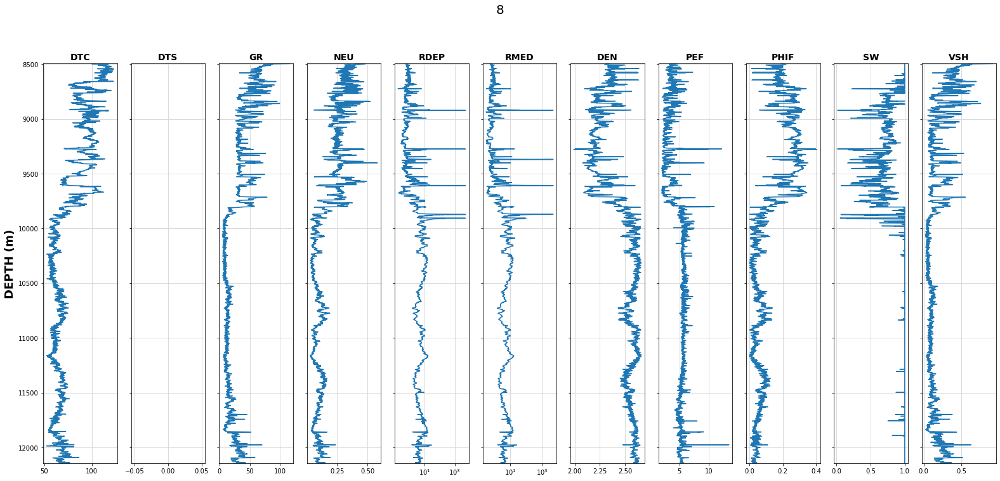

In [39]:
well = 8
create_plot(wellnames[well], train_datas_wells[well], curves_to_plot, train_datas_wells[well]['DEPTH'], logarithmic_curves)

In [41]:
def make_boxplot(welldata, inputs):

    num_inputs = len(inputs)

    fig, axs = plt.subplots(1, num_inputs, figsize=(20,10))

    for i, (ax, curve) in enumerate(zip(axs.flat, inputs), 1):
        sns.boxplot(y=welldata[curve], ax=ax, color='cornflowerblue', showmeans=True,  
                meanprops={"marker":"o",
                           "markerfacecolor":"white", 
                           "markeredgecolor":"black",
                          "markersize":"10"},
               flierprops={'marker':'o', 
                          'markerfacecolor':'darkgreen',
                          'markeredgecolor':'darkgreen'})
        
        ax.set_title(inputs[i-1])
        ax.set_ylabel('')

    plt.subplots_adjust(hspace=0.15, wspace=1.25)
    plt.show()

In [64]:
well_0=train_data.loc[train_data.WELLNUM==0]
well_0.describe()

,WELLNUM,DEPTH,DTC,DTS,DEN,GR,NEU,PEF,RDEP,RMED,PHIF,SW,VSH
count,1880.0,1880.000000,1880.000000,0.0,1880.000000,1880.000000,1880.000000,0.0,1880.000000,1880.000000,1880.000000,1880.000000,1880.000000
mean,0.0,14591.420743,79.685261,NaN,2.438382,57.031396,0.199087,NaN,4.343955,3.672391,0.141878,0.878460,0.386786
std,0.0,271.445186,11.851970,NaN,0.110390,33.222726,0.081285,NaN,16.311322,11.357025,0.059811,0.222048,0.305142
min,0.0,14121.660105,1.025100,NaN,2.158000,11.054300,0.079777,NaN,0.283100,0.322000,0.000000,0.075468,-0.248000
25%,0.0,14356.535105,72.908925,NaN,2.351525,43.276550,0.155209,NaN,0.736125,0.785725,0.105880,0.864177,0.244369
50%,0.0,14591.410105,78.358800,NaN,2.467850,51.766000,0.182478,NaN,1.166850,1.211300,0.132582,0.964610,0.339936
75%,0.0,14826.285105,86.222875,NaN,2.519525,62.287350,0.224442,NaN,1.542850,1.541600,0.192111,1.000000,0.454783
max,0.0,15063.660105,123.134500,NaN,3.001300,304.333700,0.862567,NaN,198.537100,115.635000,0.269308,1.000000,2.460104


['DEPTH', 'DTC', 'DTS', 'DEN', 'GR', 'NEU', 'PEF', 'RDEP', 'RMED', 'PHIF', 'SW', 'VSH']
Total Number of Samples: 42309


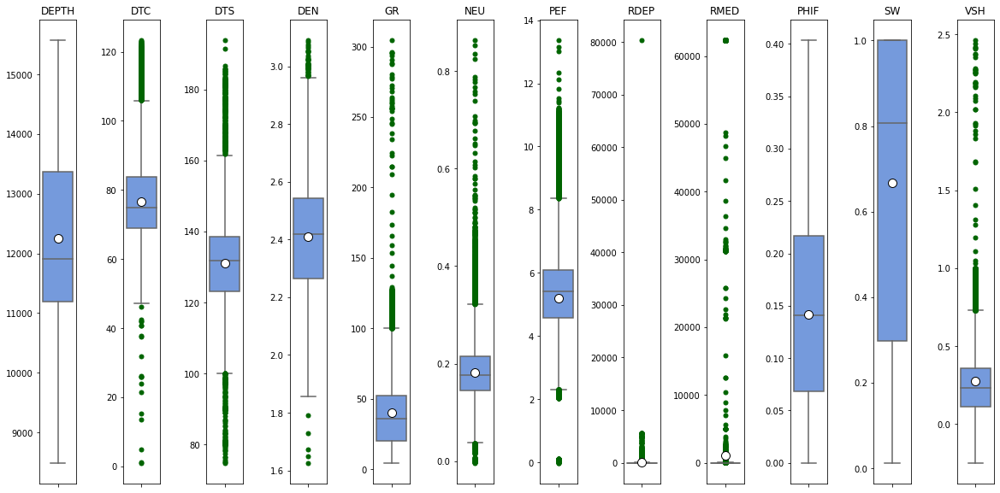

In [66]:
inputs = list(train_data.columns)
inputs.pop(0) # remove the well name from the columns list
print(inputs)
print(f'Total Number of Samples: {len(train_data)}')
make_boxplot(train_data, inputs)

In [67]:
import matplotlib
def make_xplot(welldata, xvar, yvar,  color, rows=1, cols=1, xscale=[0,1], yscale=[0,1], vmin=0, vmax=100):
    fig, axs = plt.subplots(rows, cols, figsize=(25,5))
    cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["green","yellow","red"])
    
    for (WELLNUM, welldata), ax in zip(grouped, axs.flat):
        sc = ax.scatter(x=xvar, y=yvar, data=welldata, s=5, c=color, vmin=vmin, vmax=vmax, cmap=cmap)
#         sns.scatterplot(x=xvar, y=yvar, data=welldata, hue=color, ax=ax, legend=False, palette="viridis")

        ax.set_ylim(yscale[0], yscale[1])
        ax.set_xlim(xscale[0], xscale[1])
        ax.set_ylabel(yvar)
        ax.set_xlabel(xvar)
        ax.set_title(WELLNUM)
        
        fig.colorbar(sc, ax=ax)
    plt.tight_layout()
    plt.show()

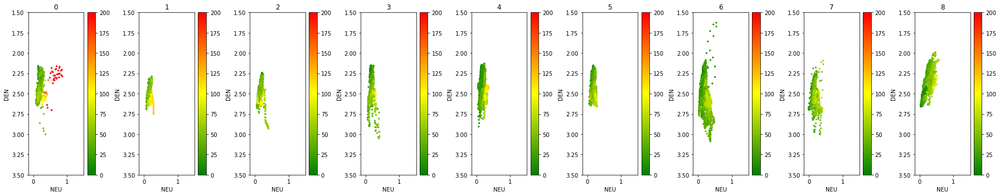

In [101]:
grouped = train_data.groupby('WELLNUM')
make_xplot(grouped, 'NEU', 'DEN', 'GR', 1, 9, [-0.15, 1.5], [3.5,1.5], 0, 200)

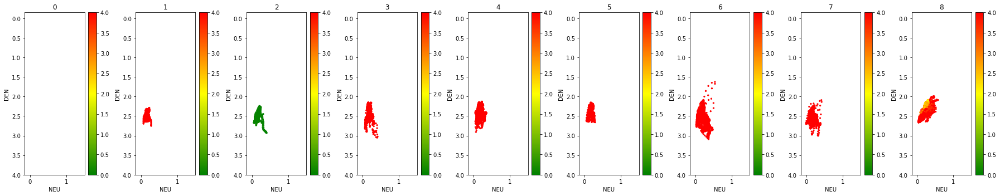

In [60]:
grouped = train_data.groupby('WELLNUM')
make_xplot(grouped, 'NEU', 'DEN', 'PEF', 1, 9, [-0.15, 1.5], [4,-0.15], 0, 4)

In [122]:
#Data preparation for with Automated Methods
outliers_detection=train_data[['WELLNUM', 'DEPTH', 'GR', 'NEU', 'DEN','PEF', 'RMED', 'RDEP', 'PHIF', 'SW', 'VSH']]
outliers_detection.describe()

,WELLNUM,DEPTH,GR,NEU,DEN,PEF,RMED,RDEP,PHIF,SW,VSH
count,42309.000000,42309.000000,42309.000000,42306.000000,42309.000000,40429.000000,42309.000000,42075.000000,42309.000000,42309.000000,42309.000000
mean,4.985866,12245.593757,39.888234,0.181612,2.411064,5.185693,1029.768280,25.199747,0.141736,0.667124,0.275485
std,2.268441,1604.293688,24.822777,0.066775,0.160632,1.715554,7800.685663,440.389867,0.081144,0.354821,0.206619
min,0.000000,8494.000000,4.588597,-0.003400,1.626600,-0.013100,0.139400,0.129500,0.000000,0.013000,-0.248000
25%,4.000000,11191.600000,20.069900,0.144110,2.264400,4.583000,1.531300,1.475490,0.068437,0.297700,0.113500
50%,6.000000,11910.110000,35.799400,0.176400,2.419800,5.414100,3.327200,2.785300,0.141000,0.808000,0.232600
75%,6.000000,13375.330000,52.007100,0.215500,2.544000,6.096800,11.222060,9.129700,0.217000,1.000000,0.360400
max,8.000000,15566.930000,304.333700,0.862567,3.089600,13.356600,62290.800000,80266.800000,0.403294,1.000000,2.460104


In [123]:
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.neighbors import LocalOutlierFactor

# Create a copy of the dataframe so that the original remanins untouched and extract the required curves
#anomaly_df = train_data[['WELLNUM', 'DEPTH', 'GR', 'NEU', 'DEN', 'RMED', 'RDEP', 'DTC', 'PEF', 'DTS', 'PHIF', 'SW', 'VSH']].copy()
anomaly_df=outliers_detection

# Drop any null values. This method drops the entire row of data if one of the cells in that row
# contains a null (NaN) value
anomaly_df.dropna(inplace=True)

# Define the inputs for the anomaly detection
anomaly_inputs = ['NEU', 'DEN', 'GR', 'RDEP', 'RMED','PEF']

# Setup the models, each will have a contamination (outlier) fraction of 0.1
# The random_state is set to allow repeatable results for the Isolation Forest. 
#This can be omitted if required.
model_IF = IsolationForest(n_estimators=100, max_samples='auto', contamination=float(0.1), max_features=1.0, random_state=42)
model_SVM = OneClassSVM(nu=0.10)
model_lof = LocalOutlierFactor(contamination=0.1, novelty=True)

models = {'IF':model_IF, 
        'SVM': model_SVM,
        'LOF': model_lof}

for name, model in models.items():
    print(f'Fitting: {name}')
    model.fit(anomaly_df[anomaly_inputs])
    anomaly_df[f'{name}_anomaly_scores'] = model.decision_function(anomaly_df[anomaly_inputs])
    anomaly_df[f'{name}_anomaly'] = model.predict(anomaly_df[anomaly_inputs])

print('Model Fitting Complete')
anomaly_df.head(5)
anomaly_df.to_csv("outliers_detection.csv")

C:\Users\djnav\anaconda3\envs\petro\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


Fitting: IF


C:\Users\djnav\anaconda3\envs\petro\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\djnav\AppData\Local\Temp/ipykernel_15596/619934903.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  anomaly_df[f'{name}_anomaly_scores'] = model.decision_function(anomaly_df[anomaly_inputs])
C:\Users\djnav\anaconda3\envs\petro\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
C:\Users\djnav\AppData\Local\Temp/ipykernel_15596/619934903.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

Fitting: SVM


C:\Users\djnav\AppData\Local\Temp/ipykernel_15596/619934903.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  anomaly_df[f'{name}_anomaly_scores'] = model.decision_function(anomaly_df[anomaly_inputs])
C:\Users\djnav\AppData\Local\Temp/ipykernel_15596/619934903.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  anomaly_df[f'{name}_anomaly'] = model.predict(anomaly_df[anomaly_inputs])


Fitting: LOF


C:\Users\djnav\anaconda3\envs\petro\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but LocalOutlierFactor was fitted with feature names
  warnings.warn(
C:\Users\djnav\AppData\Local\Temp/ipykernel_15596/619934903.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  anomaly_df[f'{name}_anomaly_scores'] = model.decision_function(anomaly_df[anomaly_inputs])
C:\Users\djnav\anaconda3\envs\petro\lib\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but LocalOutlierFactor was fitted with feature names
  warnings.warn(
C:\Users\djnav\AppData\Local\Temp/ipykernel_15596/619934903.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

Model Fitting Complete


In [124]:
anomaly_df.shape

(40192, 17)

Outlier Method: IF
Number of anomalous values 4020
Number of non anomalous values  36172
Total Number of Values: 40192
Outlier Method: SVM
Number of anomalous values 4016
Number of non anomalous values  36176
Total Number of Values: 40192
Outlier Method: LOF
Number of anomalous values 3618
Number of non anomalous values  36574
Total Number of Values: 40192


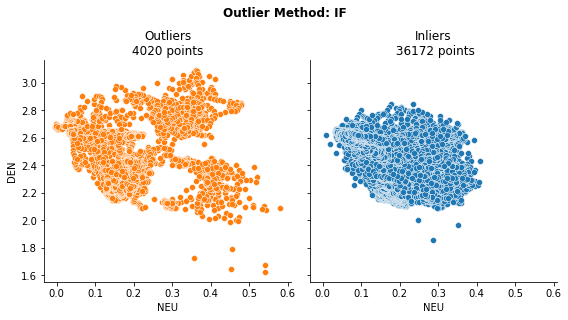

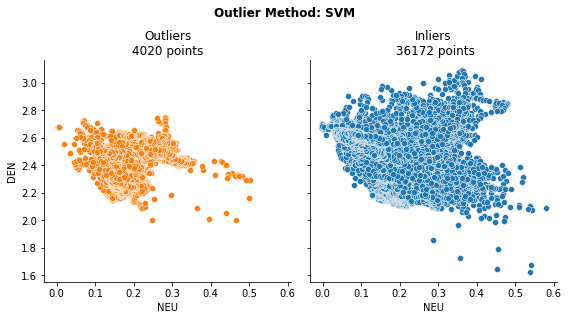

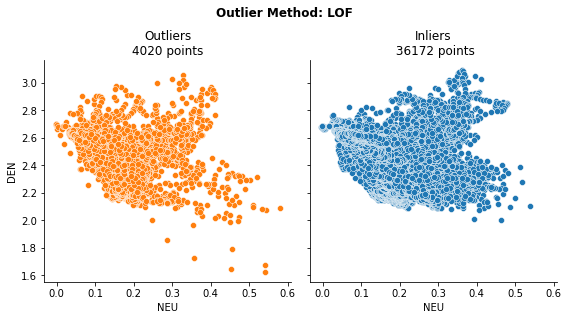

In [125]:
#We can now check the performance of each of the models using density-neturon crossplots. 
#This is achieved using Seaborn's FacetGrid and mapping a scatter plot to it.
for name in models.keys():
    print(f'Outlier Method: {name}')
    method = f'{name}_anomaly'
    print(f"Number of anomalous values {len(anomaly_df[anomaly_df[method]==-1])}")
    print(f"Number of non anomalous values  {len(anomaly_df[anomaly_df[method]== 1])}")
    print(f'Total Number of Values: {len(anomaly_df)}')

    g = sns.FacetGrid(anomaly_df, col=method, height=4, hue=method, hue_order=[1,-1])
    g.map(sns.scatterplot, 'NEU', 'DEN')
    g.fig.suptitle(f'Outlier Method: {name}', y=1.10, fontweight='bold')

    axes = g.axes.flatten()
    axes[0].set_title(f"Outliers\n{len(anomaly_df[anomaly_df['IF_anomaly']== -1])} points")
    axes[1].set_title(f"Inliers\n {len(anomaly_df[anomaly_df['IF_anomaly']==  1])} points")

plt.show()

In [126]:
#We can now check the performance of each of the models using density-neturon crossplots. 
#This is achieved using Seaborn's FacetGrid and mapping a scatter plot to it.
for name in models.keys():
    print(f'Outlier Method: {name}')
    method = f'{name}_anomaly'
    Outliers=len(anomaly_df[anomaly_df[method]==-1])
    print(f"Number of anomalous values {len(anomaly_df[anomaly_df[method]==-1])}")
    Inliers=len(anomaly_df[anomaly_df[method]== 1])
    print(f"Number of non anomalous values  {len(anomaly_df[anomaly_df[method]== 1])}")
    Total_values=len(anomaly_df)
    print(f'Total Number of Values: {len(anomaly_df)}')
    Percentage_outliers=np.around((Outliers/Total_values)*100, decimals=3, out=None)
    print(f"Percentage of Outliers: {Percentage_outliers} %")

Outlier Method: IF
Number of anomalous values 4020
Number of non anomalous values  36172
Total Number of Values: 40192
Percentage of Outliers: 10.002 %
Outlier Method: SVM
Number of anomalous values 4016
Number of non anomalous values  36176
Total Number of Values: 40192
Percentage of Outliers: 9.992 %
Outlier Method: LOF
Number of anomalous values 3618
Number of non anomalous values  36574
Total Number of Values: 40192
Percentage of Outliers: 9.002 %


Outlier Method: IF
Number of anomalous values 4020
Number of non anomalous values  36172
Total Number of Values: 40192
Outlier Method: SVM
Number of anomalous values 4016
Number of non anomalous values  36176
Total Number of Values: 40192
Outlier Method: LOF
Number of anomalous values 3618
Number of non anomalous values  36574
Total Number of Values: 40192


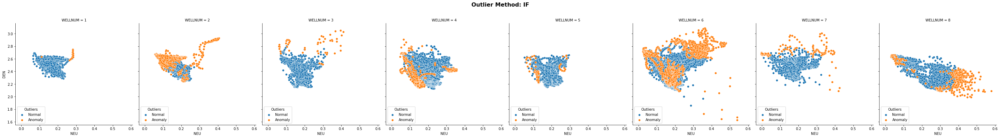

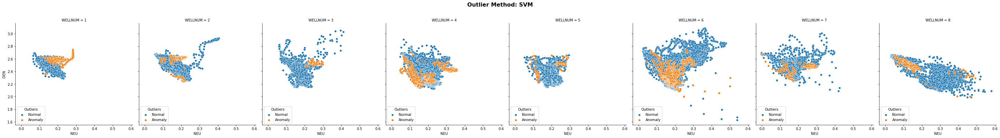

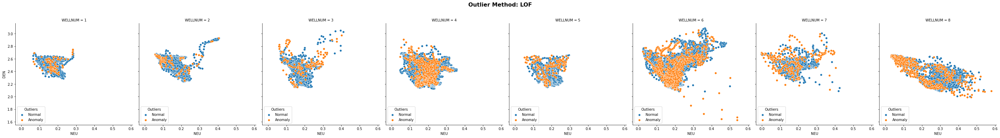

In [136]:
#We can look at the data in more detail for each of the well for each method.
for name in models.keys():
    print(f'Outlier Method: {name}')
    method = f'{name}_anomaly'
    print(f"Number of anomalous values {len(anomaly_df[anomaly_df[method]==-1])}")
    print(f"Number of non anomalous values  {len(anomaly_df[anomaly_df[method]== 1])}")
    print(f'Total Number of Values: {len(anomaly_df)}')

    g = sns.FacetGrid(anomaly_df, col='WELLNUM', hue=method, height=5, hue_order=[1,-1])
    g.map(sns.scatterplot, 'NEU', 'DEN')
    
    g.fig.suptitle(f'Outlier Method: {name}', y=1.10, fontweight='bold', fontsize=16)

    axes = g.axes.flatten()
    for ax in axes:
        ax.legend(title='Outliers', loc='lower left', labels=['Normal', 'Anomaly'])

plt.show()
#plt.savefig('Outliers_Crossplot.png')

In [128]:
#Log Plots
#To validate where the outliers have been detected, 
#we can generate simple log plots for each method and for each well.

def create_outlier_plot(wellname, dataframe, curves_to_plot, depth_curve, outlier_method, log_curves=[]):
    num_tracks = len(curves_to_plot)
    
    outlier_shading = dataframe[outlier_method]
    
    fig, ax = plt.subplots(nrows=1, ncols=num_tracks, figsize=(num_tracks*2, 10))
    fig.suptitle(f'{wellname}   -   {outlier_method}', fontsize=20, y=1.05)
    
    for i, curve in enumerate(curves_to_plot):
        
        
        ax[i].plot(dataframe[curve], depth_curve)
        
        ax[i].fill_betweenx(depth_curve, dataframe[curve].min(), dataframe[curve].max(), where=outlier_shading>= 1, color='green', alpha=0.2)
        ax[i].fill_betweenx(depth_curve, dataframe[curve].min(), dataframe[curve].max(), where=outlier_shading<= -1, color='red', alpha=0.2)
        
        ax[i].set_title(curve, fontsize=14, fontweight='bold')
        ax[i].set_ylim(depth_curve.max(), depth_curve.min())
        ax[i].grid(which='major', color='lightgrey', linestyle='-')

        
        if i == 0:
            ax[i].set_ylabel('DEPTH (m)', fontsize=18, fontweight='bold')
        else:
            plt.setp(ax[i].get_yticklabels(), visible = False)
        
        # Check to see if we have any logarithmic scaled curves
        if curve in log_curves:
            ax[i].set_xscale('log')
            ax[i].grid(which='minor', color='lightgrey', linestyle='-')
        
        
    
    plt.tight_layout()
    plt.show()

In [132]:
#Before plotting the data we can make things easier by splitting up 
#the dataframe into multiple dataframe based on the well name

#Creating empty lists to story the dataframes and wellnames in
dfs_wells = []
wellnames = []

#Split up the data by well
for well, data in anomaly_df.groupby('WELLNUM'):
    dfs_wells.append(data)
    wellnames.append(well)
    
# Selecting the curves that we want to plot
curves_to_plot = ['NEU', 'DEN', 'GR', 'RDEP', 'PEF','PHIF', 'SW', 'VSH']

In [133]:
#Once the dataframe has been split up by well, we can use the index number of the list to access the required data.
#If we loop through the wellnames list we can get the index number and the associated wellname.
#This method using the index of the same list rather than the enumerate method seen in Notebook 1.1.

print('Wellname \t Index')

for well in wellnames:
    print(f'{well} \t{wellnames.index(well)}')

Wellname 	 Index
1 	0
2 	1
3 	2
4 	3
5 	4
6 	5
7 	6
8 	7


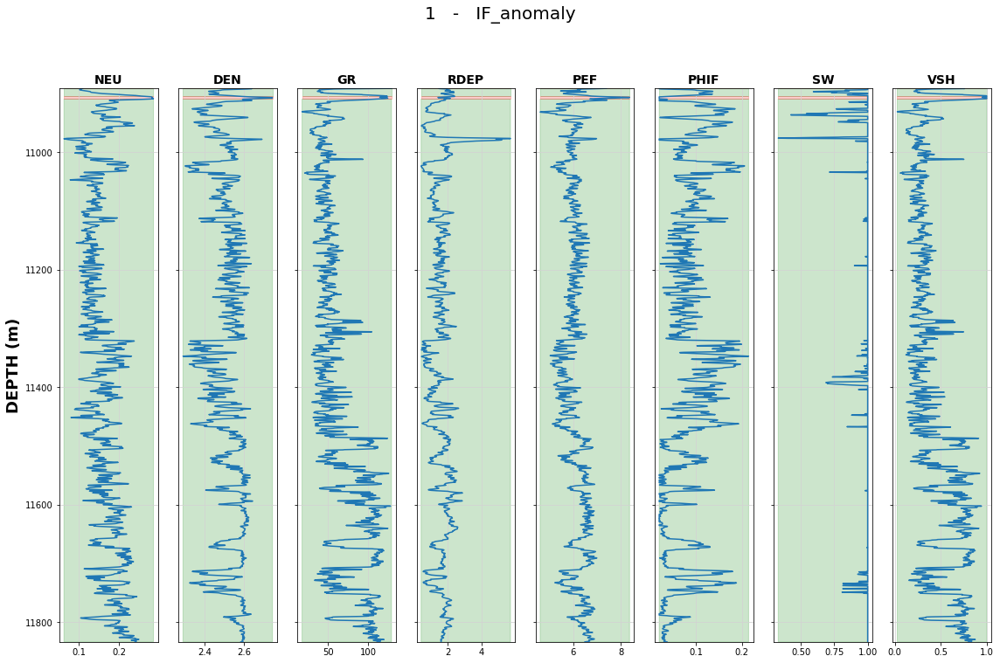

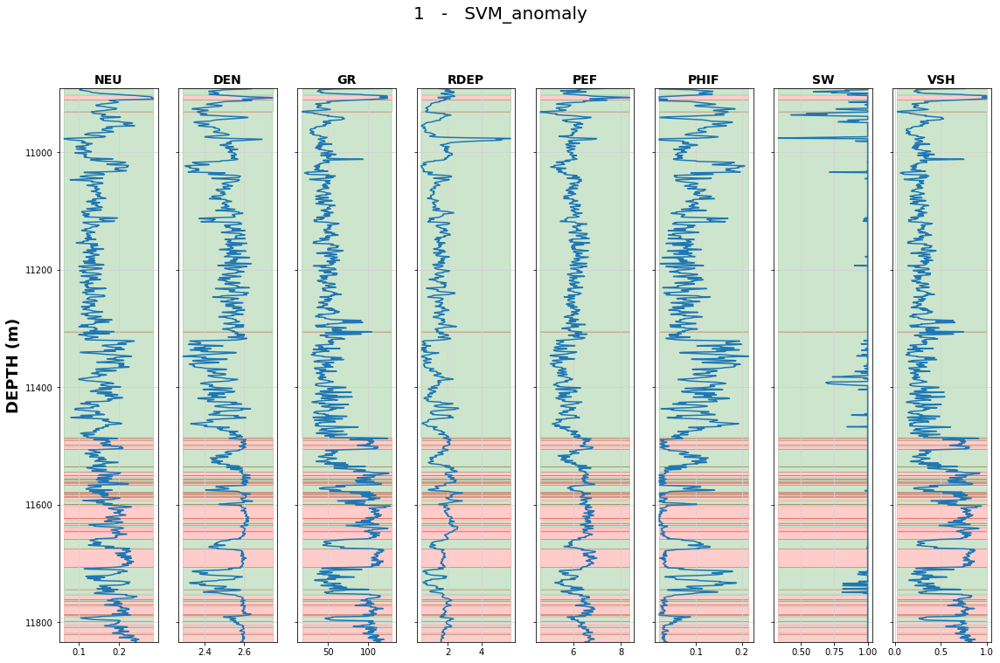

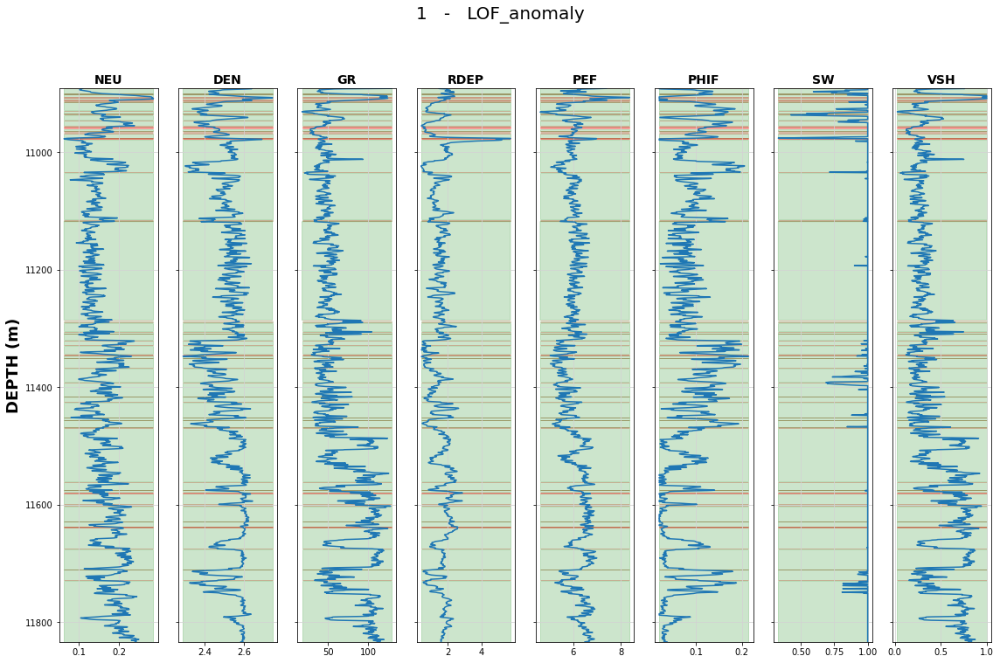

In [140]:
# Select the well by index
well = 0

# Call the function for each method:
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'IF_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'SVM_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'LOF_anomaly')

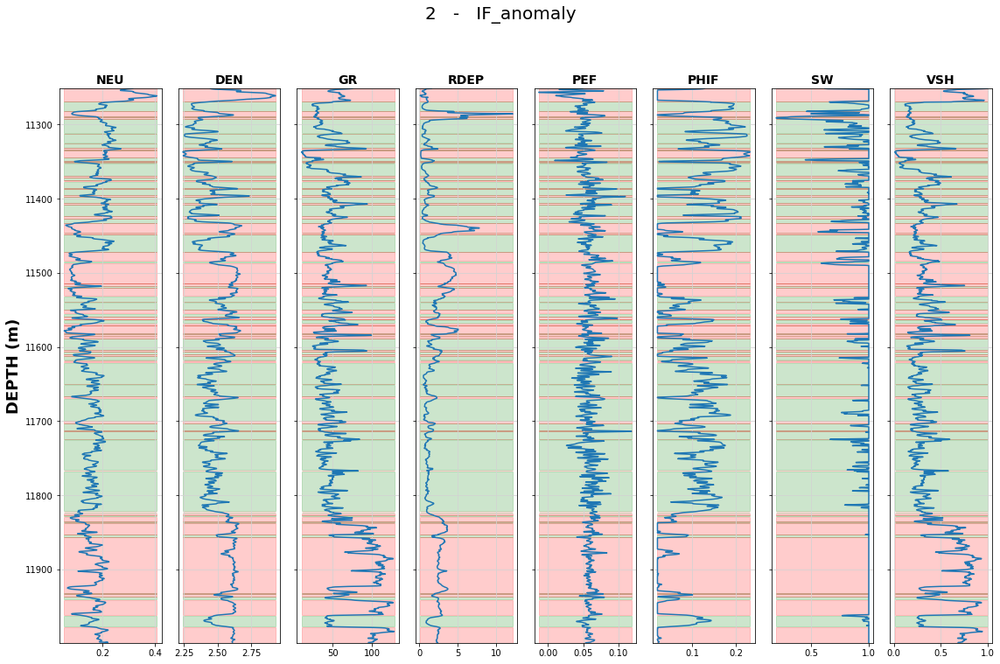

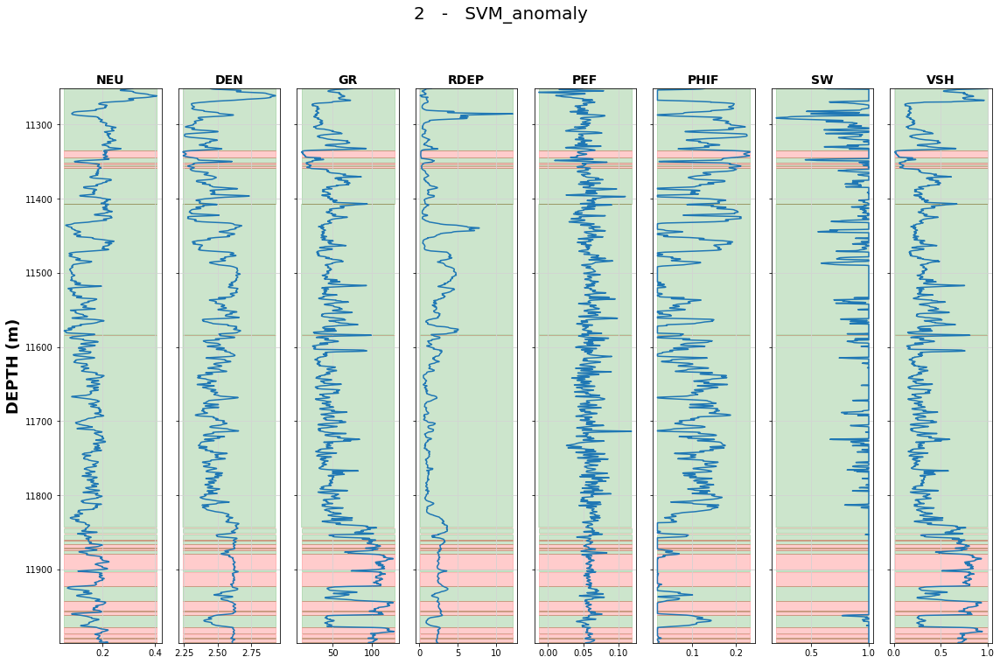

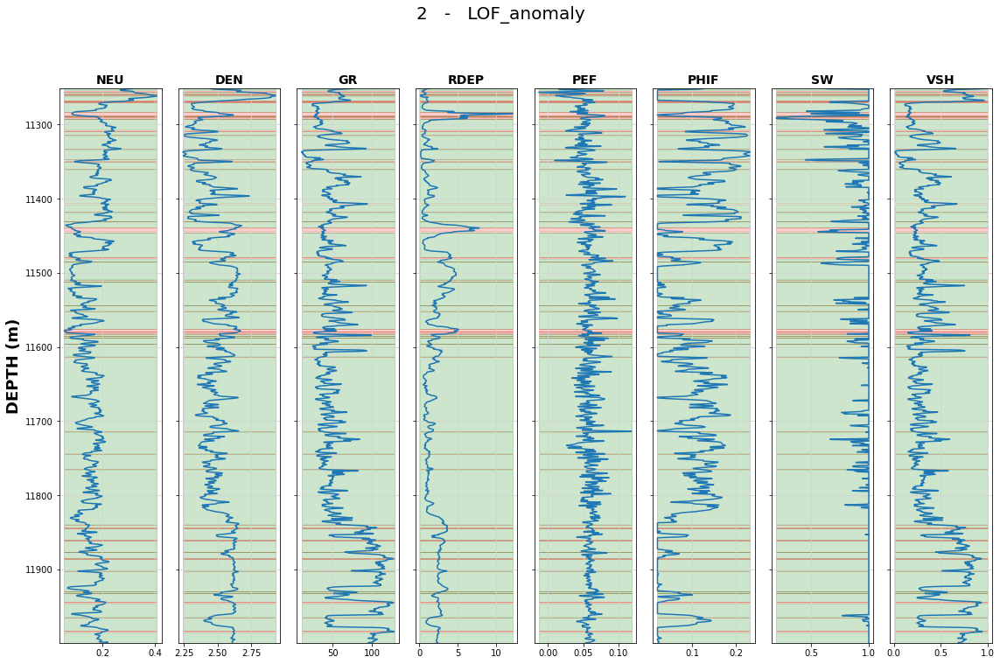

In [141]:
well = 1

# Call the function for each method:
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'IF_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'SVM_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'LOF_anomaly')

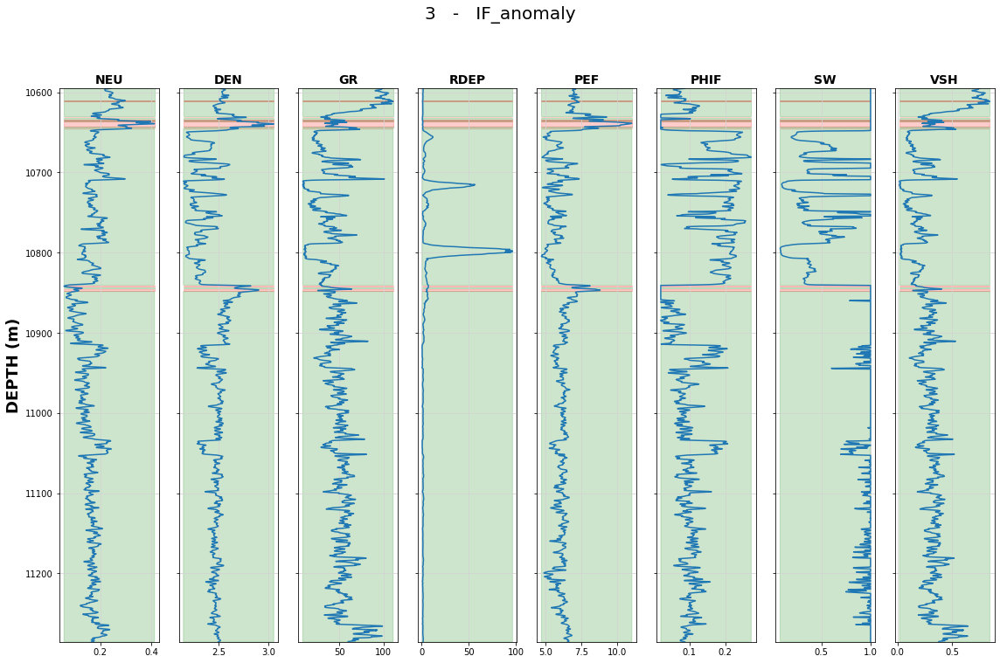

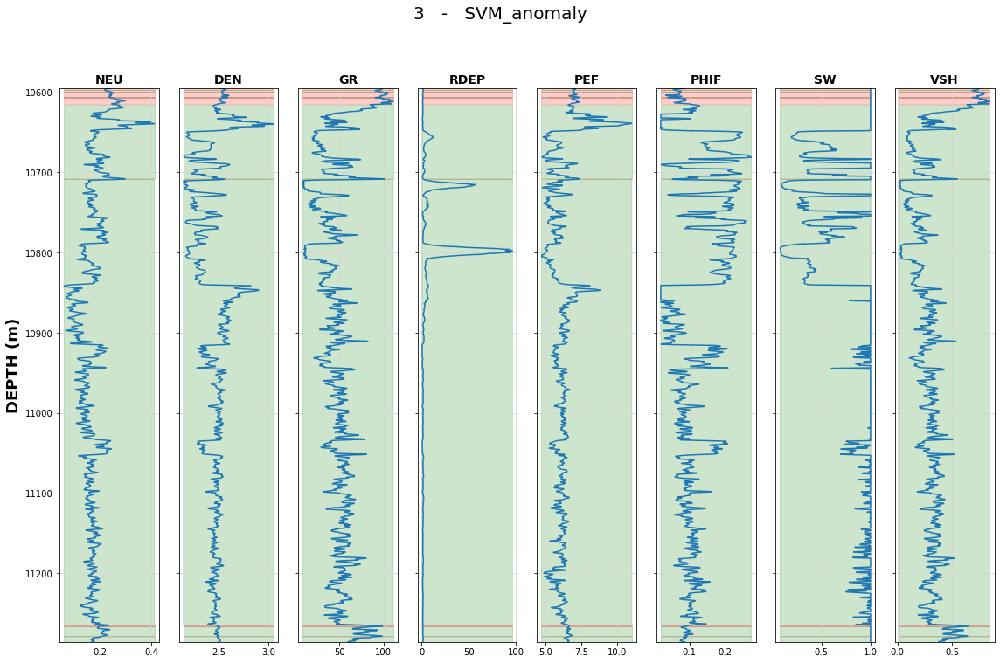

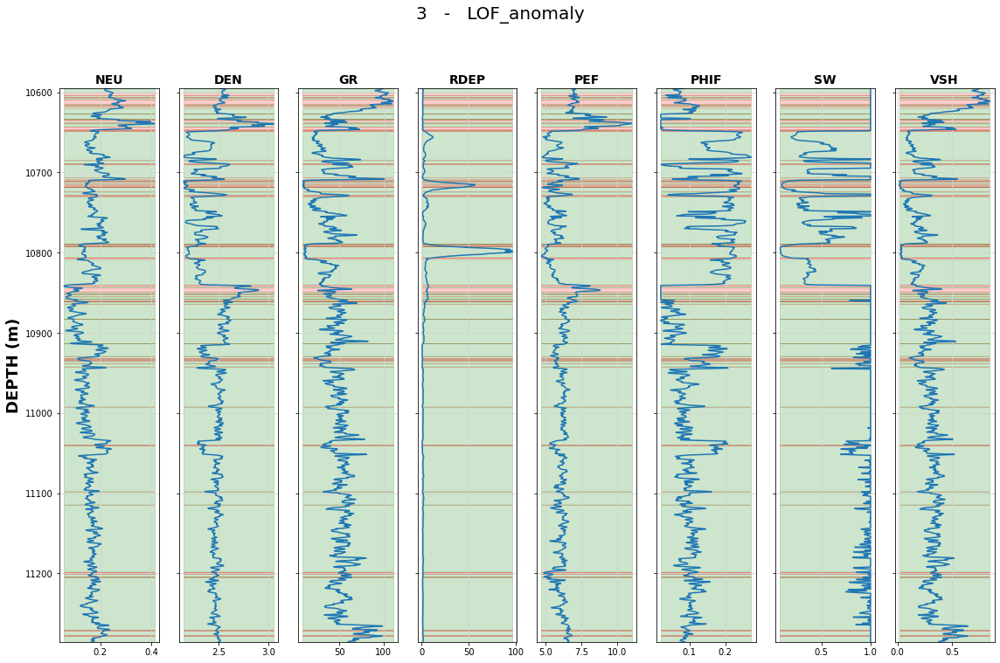

In [142]:
well = 2

# Call the function for each method:
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'IF_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'SVM_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'LOF_anomaly')

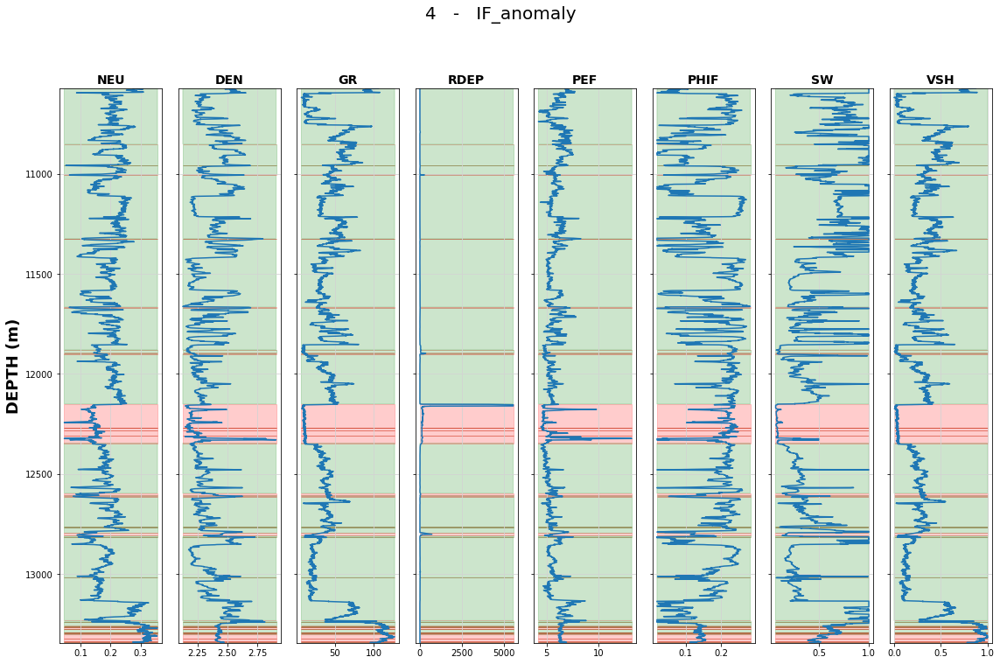

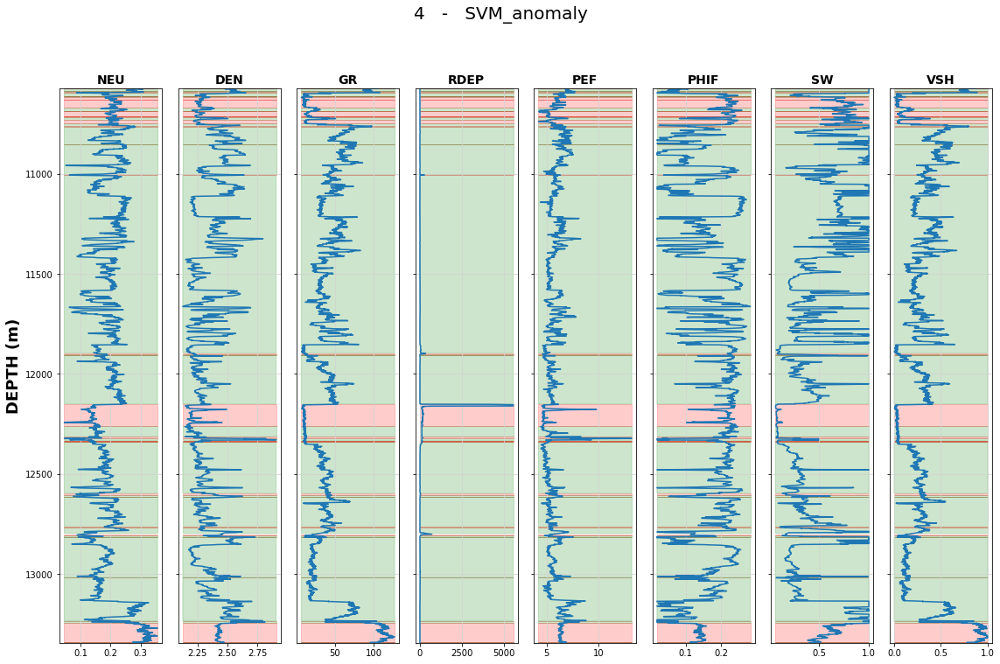

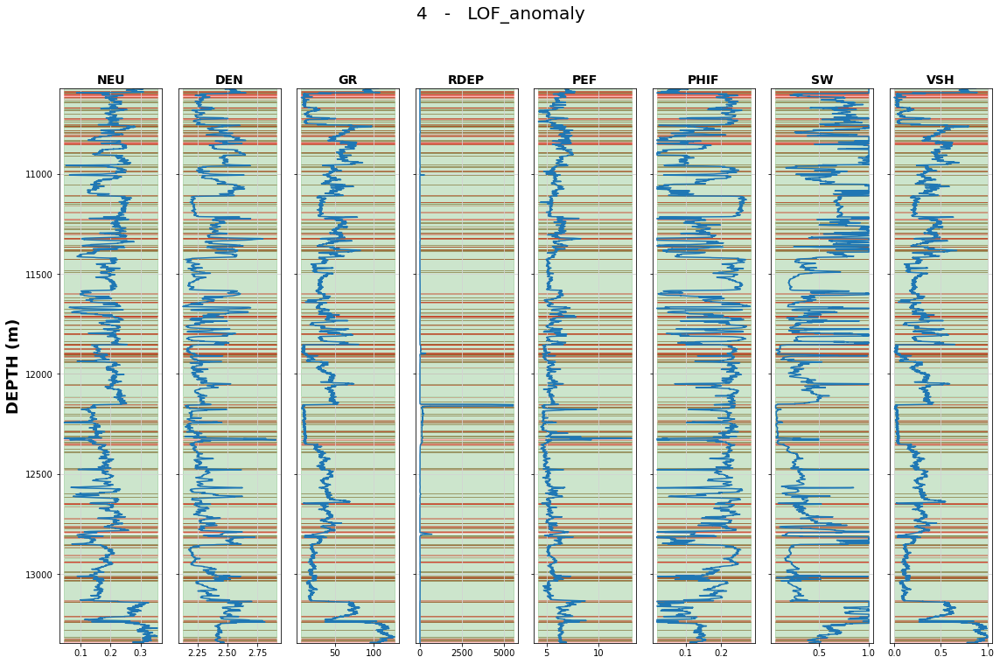

In [143]:
well = 3

# Call the function for each method:
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'IF_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'SVM_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'LOF_anomaly')

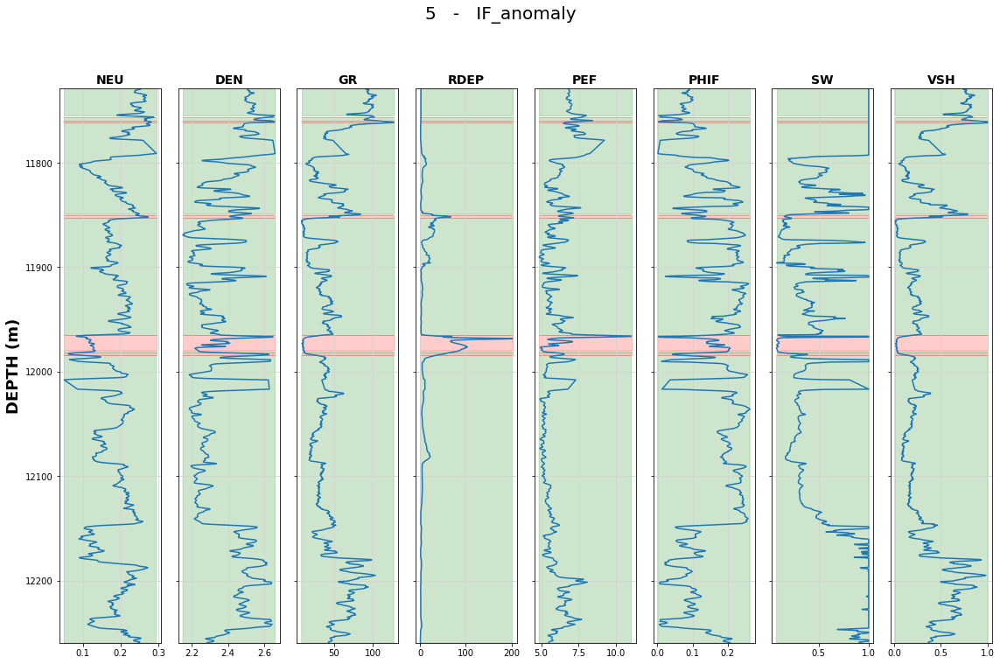

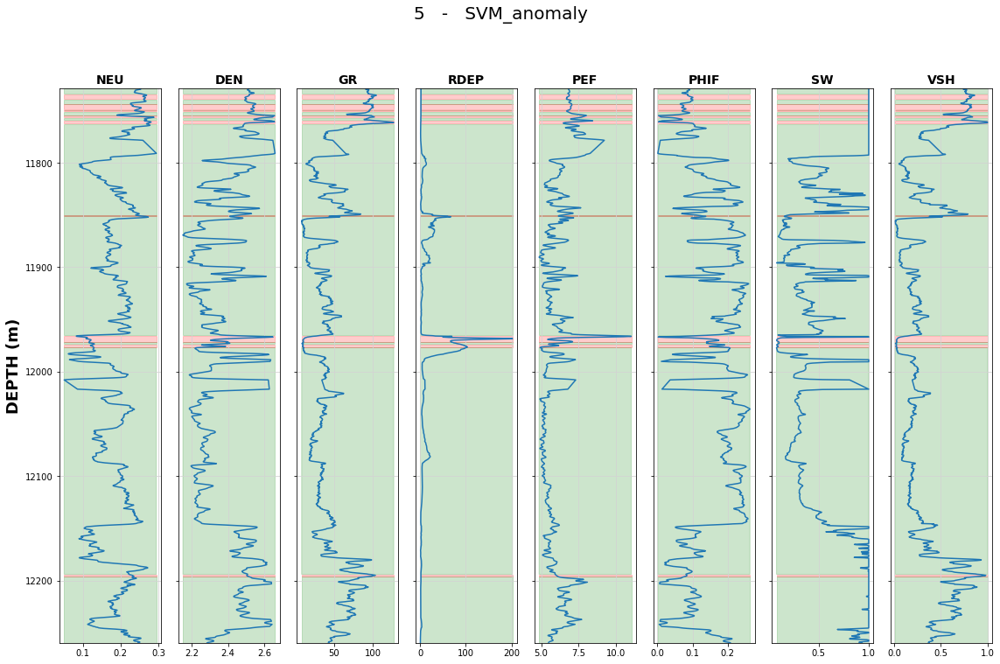

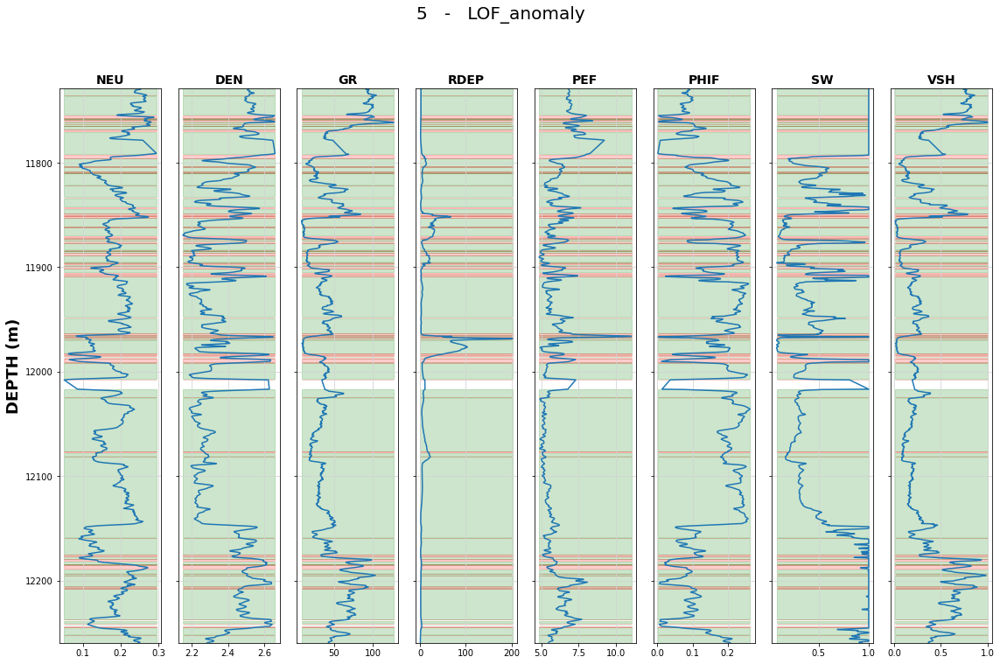

In [144]:
well = 4

# Call the function for each method:
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'IF_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'SVM_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'LOF_anomaly')

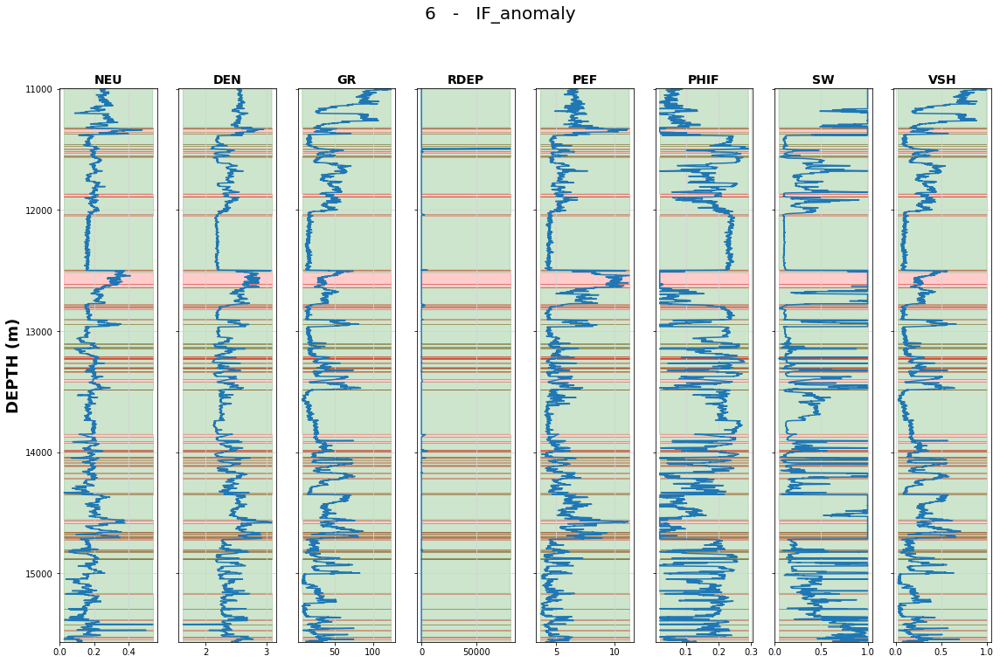

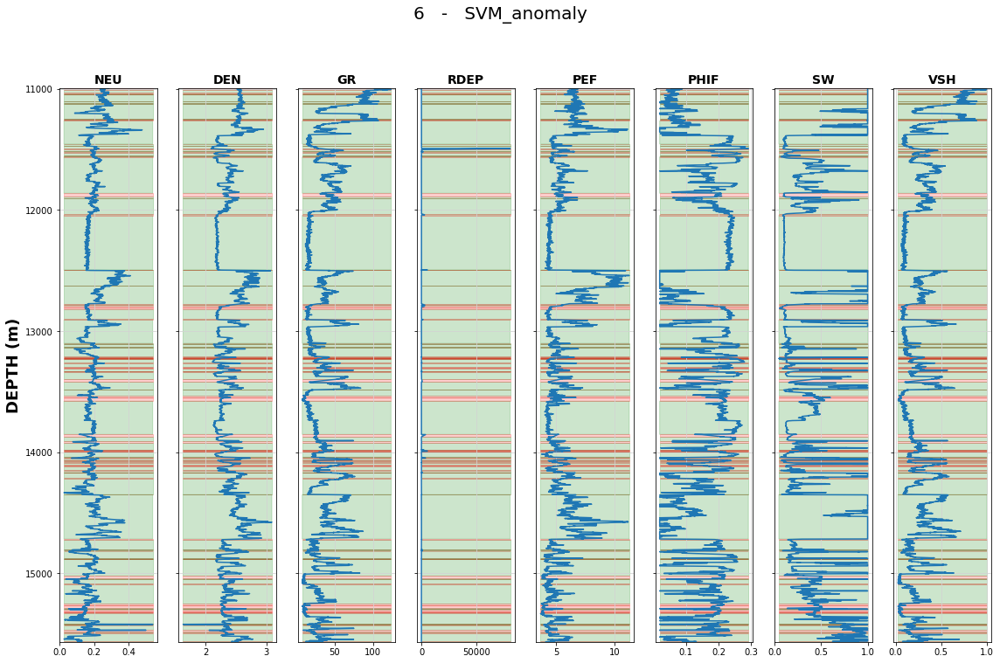

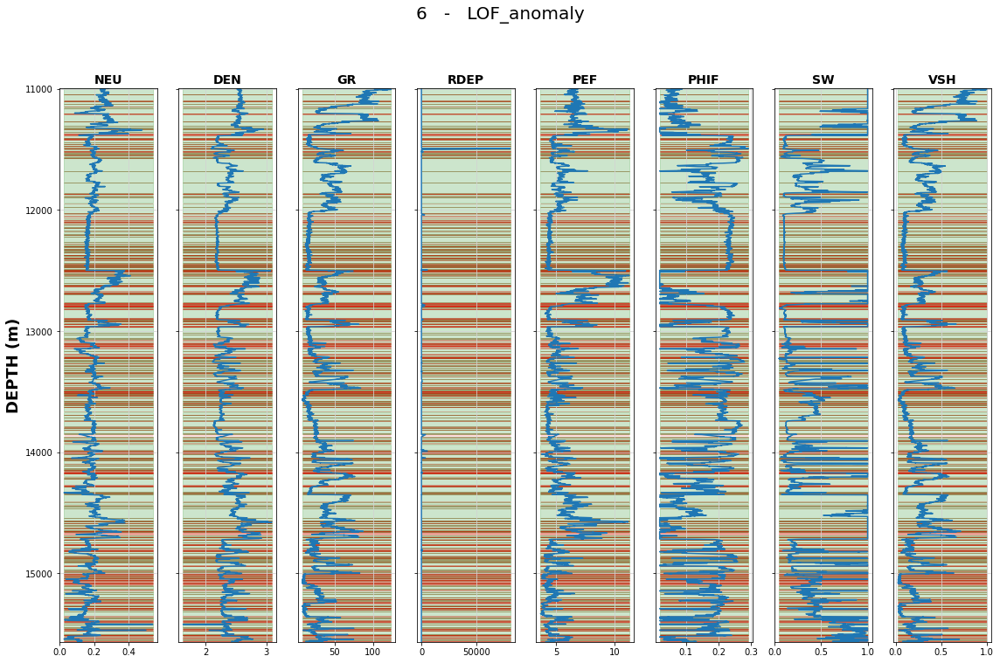

In [145]:
well = 5

# Call the function for each method:
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'IF_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'SVM_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'LOF_anomaly')

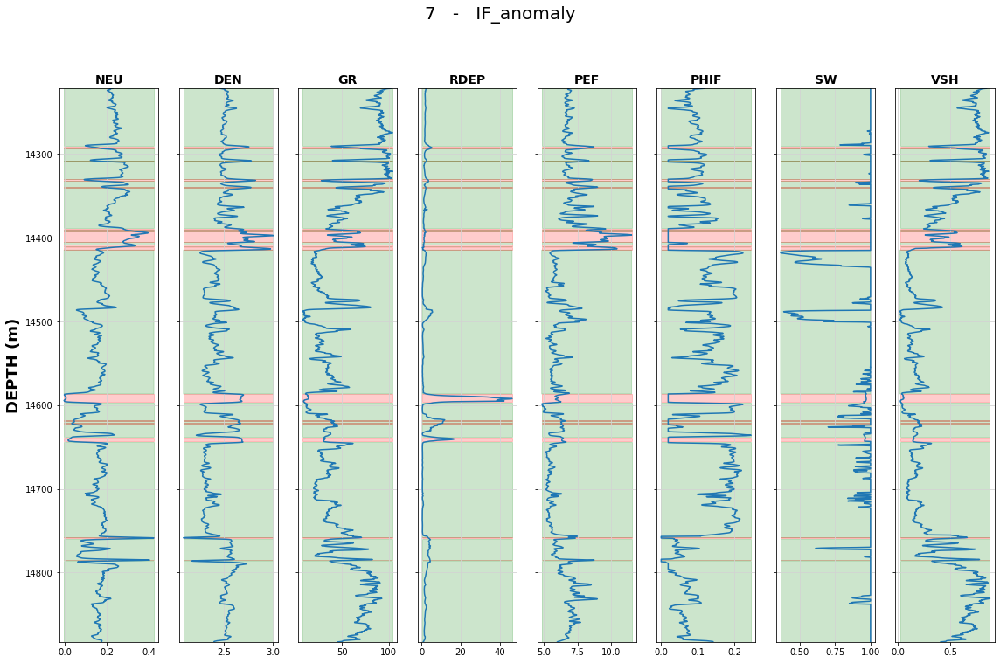

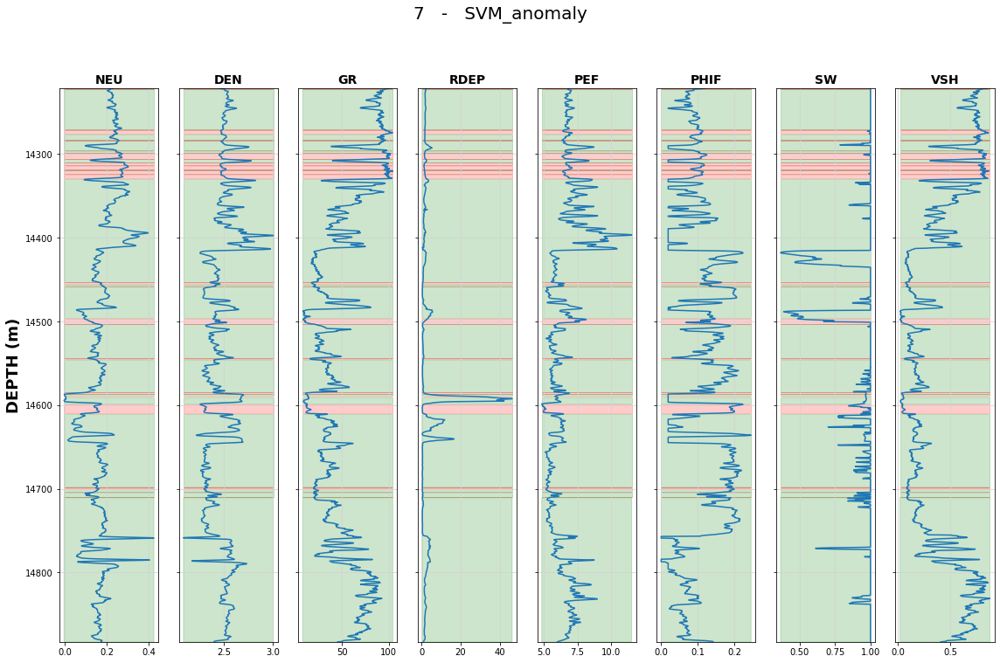

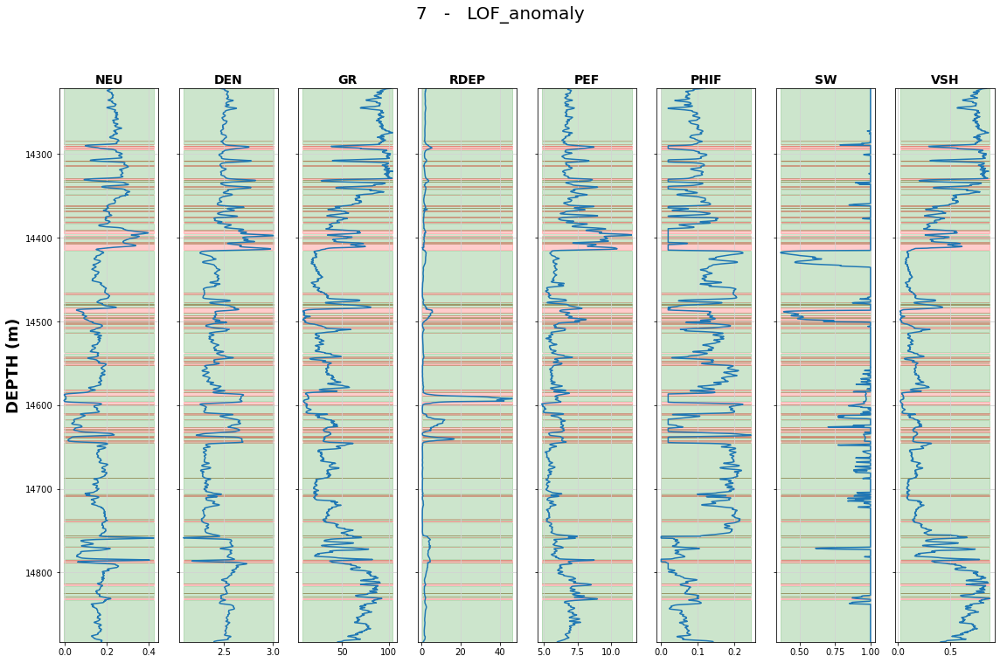

In [146]:
well = 6

# Call the function for each method:
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'IF_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'SVM_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'LOF_anomaly')

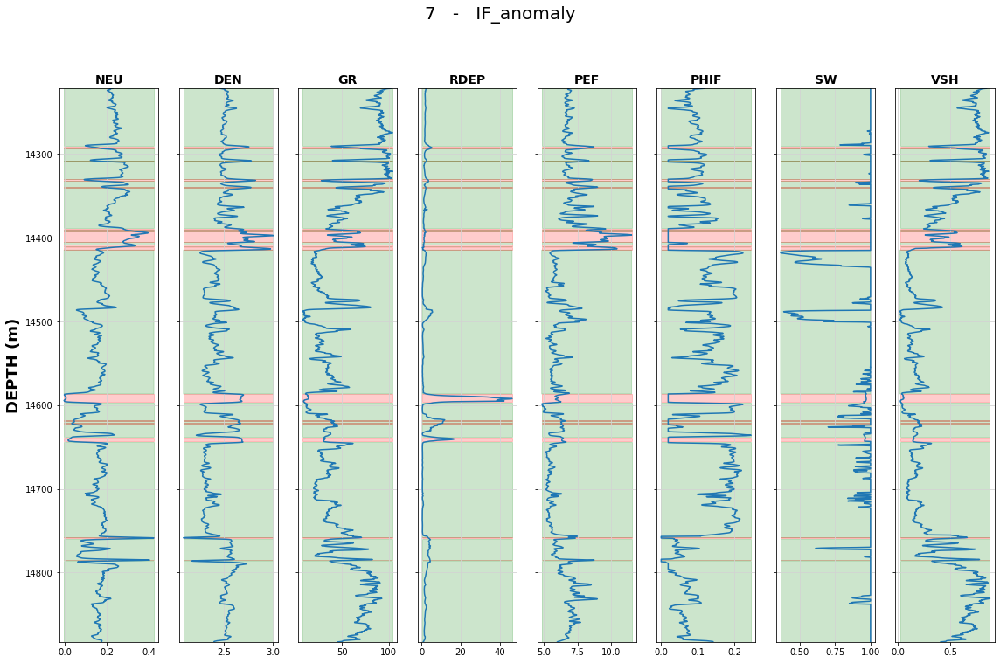

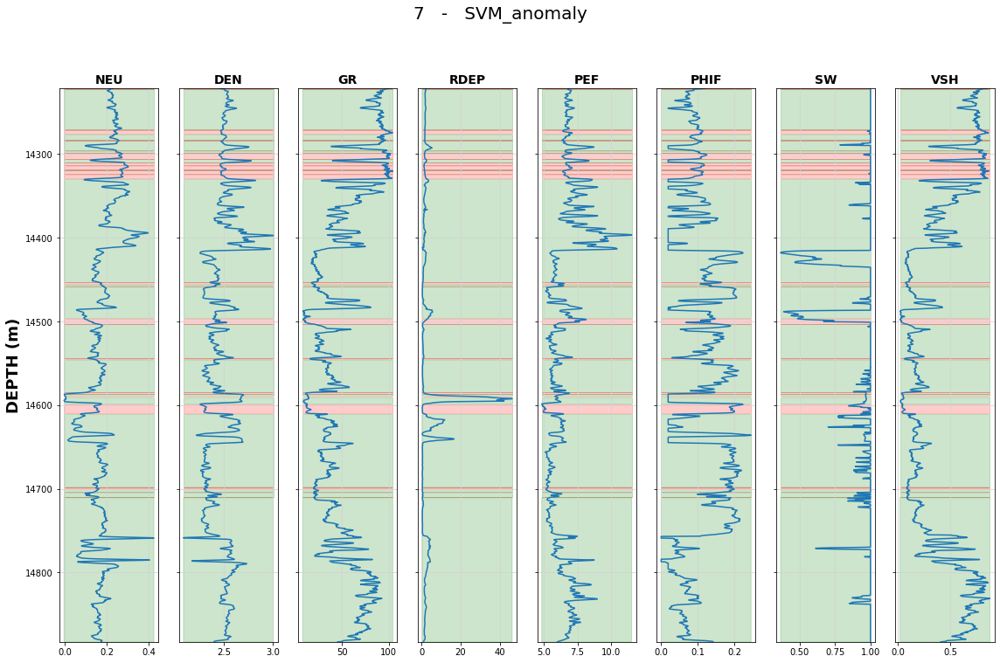

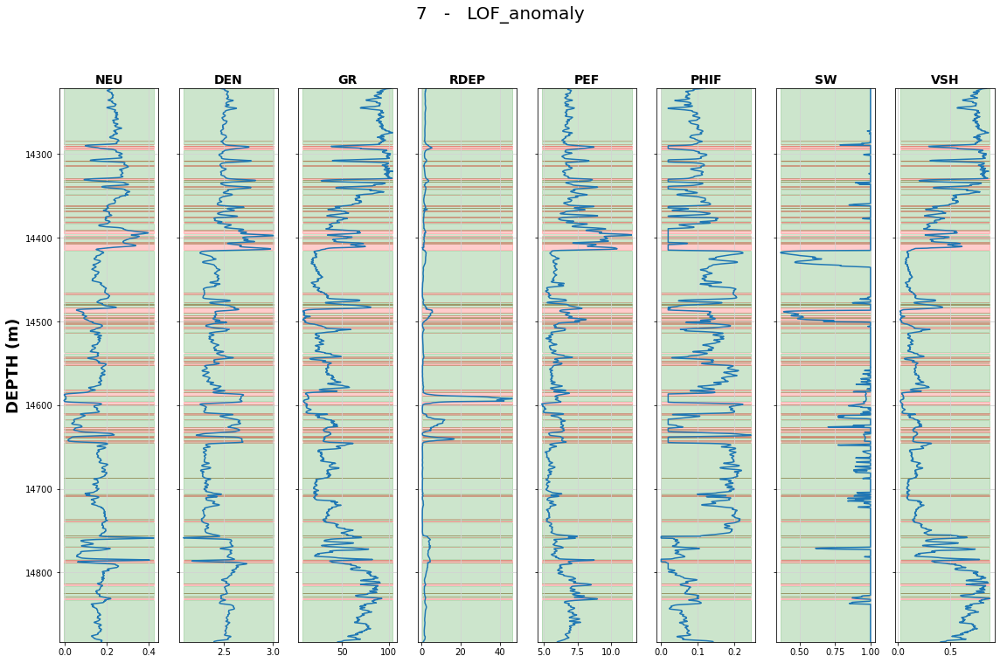

In [147]:
well = 6

# Call the function for each method:
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'IF_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'SVM_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'LOF_anomaly')

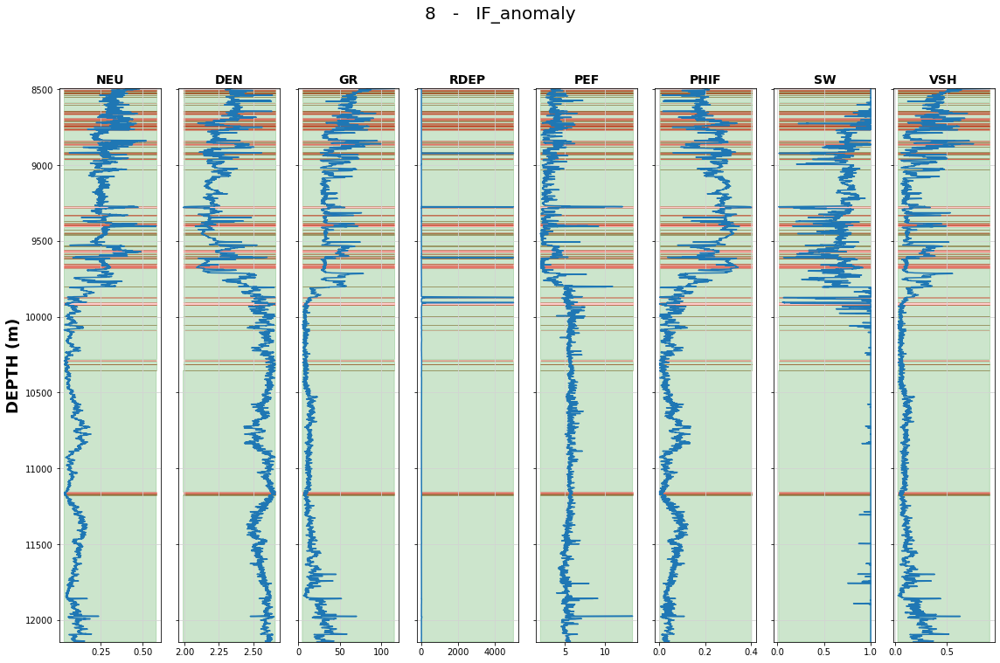

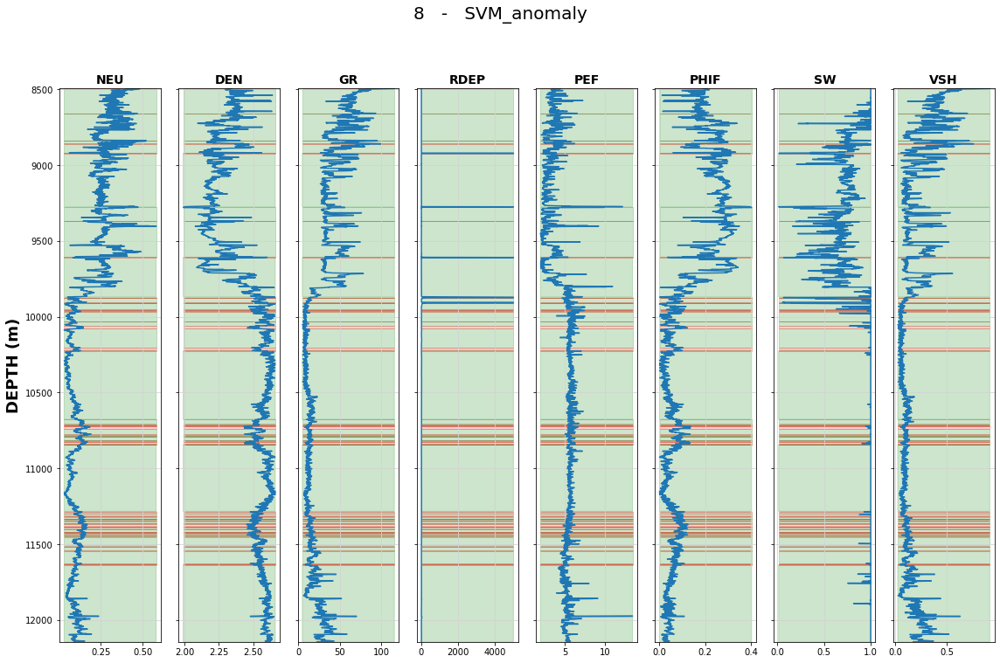

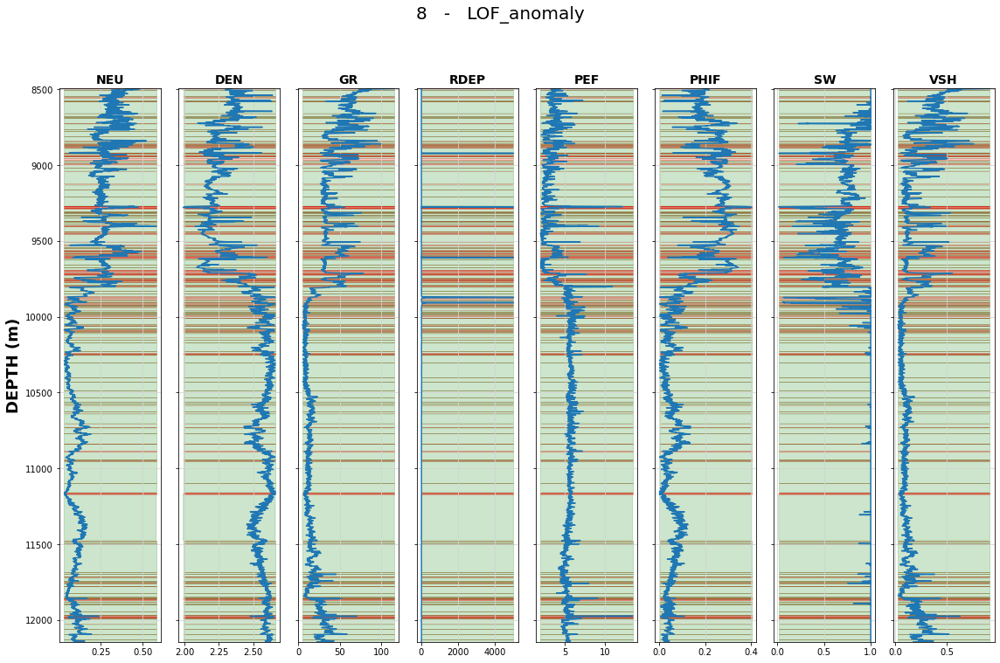

In [148]:
well = 7

# Call the function for each method:
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'IF_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'SVM_anomaly')
create_outlier_plot(wellnames[well], dfs_wells[well], curves_to_plot, dfs_wells[well]['DEPTH'], 'LOF_anomaly')